## Table of Contents
1. Class Activation Mapping
2. Prerequisites
3. CAM Algorithm
4. Grad-CAM Algorithm
5. Grad-CAM++ Algorithm
6. Counterfactual Explanations usign Grad-CAM
7. Guided Grad-CAM and Guided Grad-CAM++
8. Conv Layer Comparison for ResNet50
9. References

## 1. Class Activation Mapping
Class Activation Mapping refers to the process of creating a **heatmap**, that, when superimposed on the original input, visualizes which parts of the image a CNN is **paying attention** to for producing a chosen neurons activation. 

<br><br>

<center> <img src="images/class_heatmaps.jpg" width="600"/> </center> 
<center>Figure from [1] illustrating the CAM heatmaps for the top 5 predictions.</center> 

## 2. Prerequisites

### Imports <a name="imports"></a>

In [1]:
from utils.guided_bp import guided_backpropagation
from utils.cam import cam, grad_cam, grad_cam_plusplus
from utils.utils import (
    load_network,
    load_and_preprocess_img,
    conv_layer_comparision,
    draw_heatmap,
    draw_guided_heatmap,
)

### Loading a Model  <a name="loading_model"></a> and Preprocessing Images <a name="preprocessing"></a>
Here is a list of all possible networks to load using keras: https://keras.io/api/applications/

We implemented only a few models but the function in the utils.py can easily be expanded:
- Look up how the respective model needs to be loaded
    - include  ```preprocess_input()``` and ```decode_predictions()```
- Find out which layer the last convolutional one is and extract it --> can be done by looking at ```model.summary()```
- Save the required input size of the images for the model in the size variable.

Keep in mind that loading the model for the first time will take a few seconds. Some might take up a few 100MB's for the weights.

## 3. CAM Algorithm [1]

CAM, as introduced by [1], was the first approach to generate class activation maps. It requires a specific architecture, where after a bunch of conv layers a global average pooling layer is followed by a single fully connected layer (image classification). Due to these contstraints and the fact that it uses the output layer weights for weighting each individual feature map, the class activation map can only be generated for a chosen class prediction w.r.t. to the final convolutional layer.


<center> <img src="images/cam.png" width="800"/> </center> 
<center> <img src="images/cam_calc.png" width="800"/> </center> 
<center> Figure adapted from [1] illustrating the CAM specific architecture requirement and the heatmap calculation.</center> 

### Run the Algorithm    <a name="run_algorithm_cam"></a>

Here you can try out the CAM algorithm. Choose a model and an image and see the heatmap for the chosen top k classes.

In [2]:
models = {
    1: "ResNet50", 
    2: "DenseNet121", 
    3: "MobileNetV2", 
    4: "Xception"
}
images = {
    1: "cat.jpg",
    2: "cat_dog.jpg",
    3: "cat_dog_2.jpg",
    4: "elephant.jpg",
    5: "squirrel.jpg",
    6: "scuba.jpg",
    7: "barbell.jpg",
    8: "church.jpg",
    9: "food.jpg",
}
TOPK = 5

model, size, last_conv_layer, preprocess_input, decode_predictions = load_network(
    models[1]
)
image, image_arr = load_and_preprocess_img(
    path="images/" + images[4], size=size, preprocess_input=preprocess_input
)

Computing CAM Heatmaps:   0%|          | 0/5 [00:00<?, ?it/s]

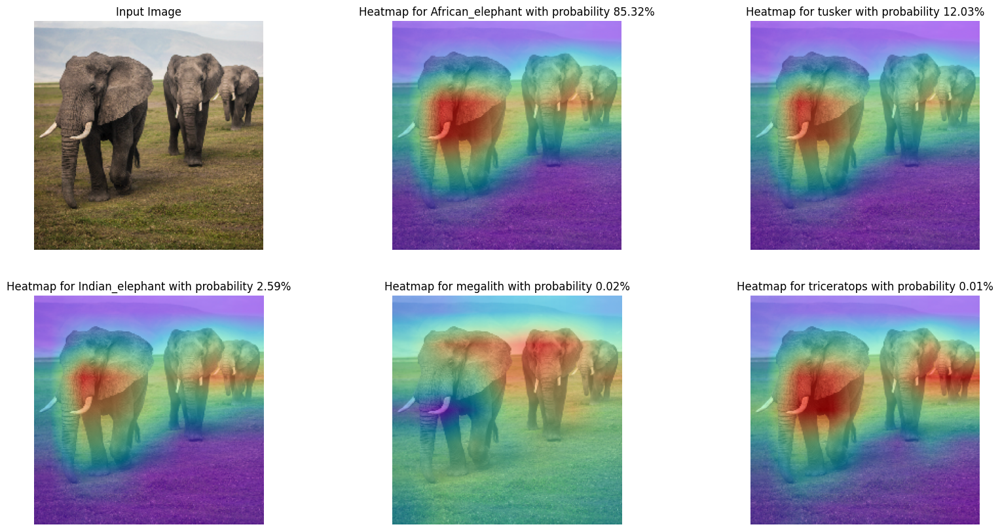

In [3]:
heatmaps = cam(model, last_conv_layer, decode_predictions, image_arr, TOPK)
draw_heatmap(image, heatmaps)

## 4. Grad-CAM Algorithm [2]

A more efficient variant is the gradient-weighted CAM. It is a **generalised version** of the original CAM approach [1] and can be applied to any kind of CNN model. The main contribution is that we now work with **gradients instead of model weights**. To be precise, it uses the gradients from a chosen neurons activation that flow into any preceeding conv layer of the network to calculate the heatmap (for a more in-depth explanation check out the comments in the respective code chunk and the linked paper below [2]). Still, the last CNN layer is often chosen because it likely represents higher level features, providing easier to interpret results.

<center> <img src="images/cam_gc.png" width="1000"/> </center> 
<center>Comparison of CAM and Grad-CAM, together with their respective calculations.</center> 

### Run the Algorithm    <a name="run_algorithm_grad_cam"></a>

Here you can try out the Grad-CAM algorithm. Choose a model and an image and see the heatmap for the chosen top k classes.


In [4]:
models = {
    1: "ResNet50", 
    2: "VGG16", 
    3: "DenseNet121", 
    4: "MobileNetV2",
    5: "Xception"
}
images = {
    1: "cat.jpg",
    2: "cat_dog.jpg",
    3: "cat_dog_2.jpg",
    4: "elephant.jpg",
    5: "squirrel.jpg",
    6: "scuba.jpg",
    7: "barbell.jpg",
    8: "church.jpg",
    9: "food.jpg",
}
TOPK = 5

model, size, last_conv_layer, preprocess_input, decode_predictions = load_network(
    models[4]
)
image, image_arr = load_and_preprocess_img(
    path="images/" + images[3], size=size, preprocess_input=preprocess_input
)

Computing Grad-CAM Heatmaps:   0%|          | 0/5 [00:00<?, ?it/s]

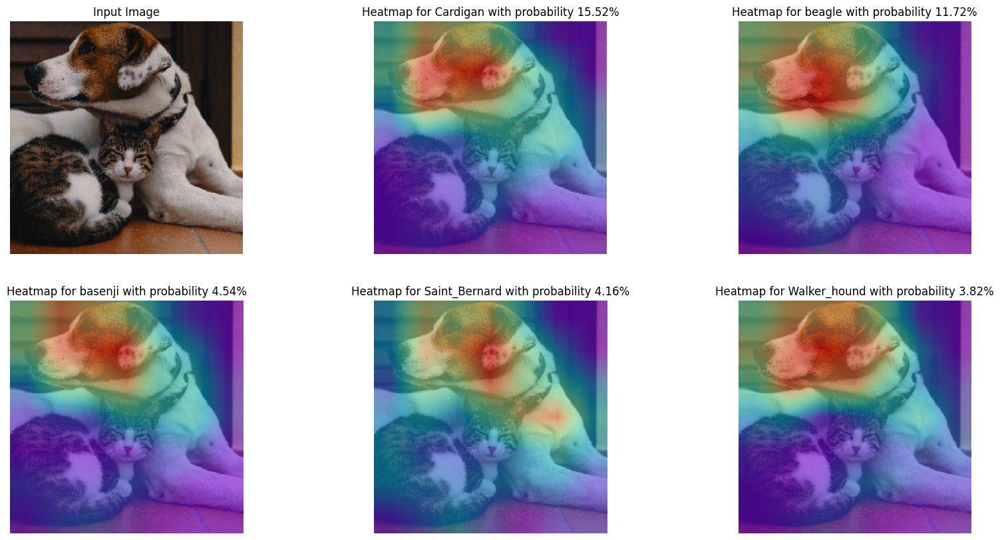

In [5]:
heatmaps = grad_cam(model, last_conv_layer, decode_predictions, image_arr, TOPK)
draw_heatmap(image, heatmaps)

## 5. Grad-CAM++ Algorithm [3]

This last method **builds upon the idea of Grad-CAM** and claims to further **increase explainability** of CNNs both in terms of **object localization** and occurrences of **multiple object-instances** in a single image. For a detailed explanation for the math involved in the following code chunk, we would recommend to read through part 3 of the original paper. 
<br><br>
<center><img src="images/cam_gc_gc++.png" width="1000"/></center>
<center>Comparison of CAM, Grad-CAM and Grad-CAM++, together with their respective calculations.</center> 
<br><br>

### Run the Algorithm    <a name="run_algorithm_grad_cam++"></a>

Here you can try out the Grad-CAM++ algorithm. Choose a model and an image and see the heatmap for the chosen top k classes.

In [6]:
models = {
    1: "ResNet50", 
    2: "VGG16", 
    3: "DenseNet121", 
    4: "MobileNetV2",
    5: "Xception"
}
images = {
    1: "cat.jpg",
    2: "cat_dog.jpg",
    3: "cat_dog_2.jpg",
    4: "elephant.jpg",
    5: "squirrel.jpg",
    6: "scuba.jpg",
    7: "barbell.jpg",
    8: "church.jpg",
    9: "food.jpg",
}
TOPK = 5

model, size, last_conv_layer, preprocess_input, decode_predictions = load_network(
    models[1]
)
image, image_arr = load_and_preprocess_img(
    path="images/" + images[6], size=size, preprocess_input=preprocess_input
)

Computing Grad-CAM++ Heatmaps:   0%|          | 0/5 [00:00<?, ?it/s]

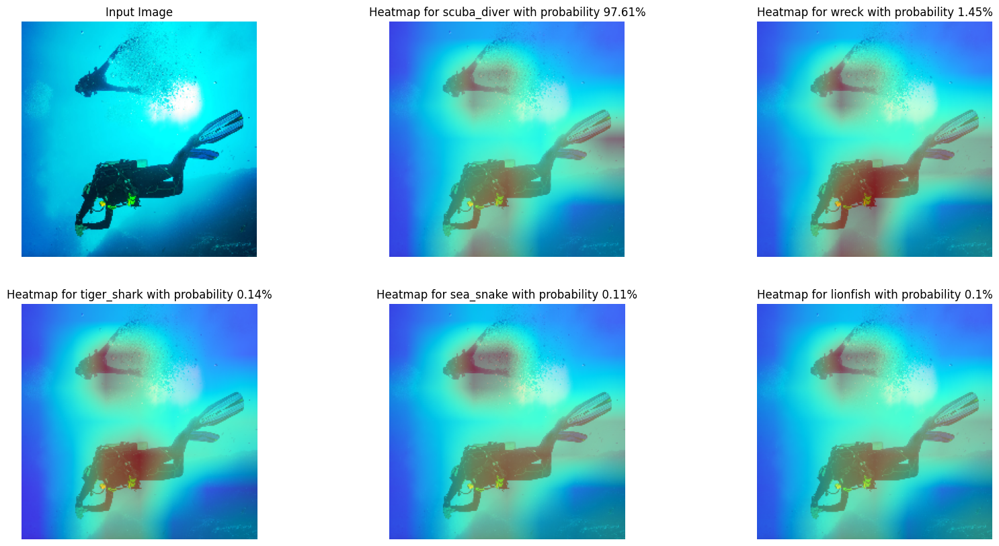

In [7]:
heatmaps = grad_cam_plusplus(
    model, last_conv_layer, decode_predictions, image_arr, TOPK
)
draw_heatmap(image, heatmaps)

## 6. Counterfactual Explanations usign Grad-CAM

Counterfactual Explanations using Grad-CAM highlight areas that most decrease the chosen network output probability for the predicted class. It is most interesting to try with two or more classes present in the input image.

In [8]:
models = {
    1: "ResNet50", 
    2: "VGG16", 
    3: "DenseNet121", 
    4: "MobileNetV2",
    5: "Xception"
}
images = {
    1: "cat.jpg",
    2: "cat_dog.jpg",
    3: "cat_dog_2.jpg",
    4: "elephant.jpg",
    5: "squirrel.jpg",
    6: "scuba.jpg",
    7: "barbell.jpg",
    8: "church.jpg",
    9: "food.jpg",
}

model, size, last_conv_layer, preprocess_input, decode_predictions = load_network(
    models[1]
)
image, image_arr = load_and_preprocess_img(
    path="images/" + images[2], size=size, preprocess_input=preprocess_input
)

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

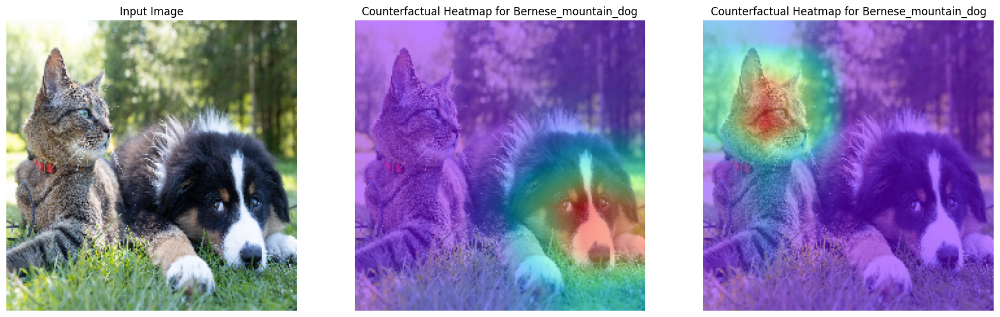

In [9]:
counterfactual_heatmap = grad_cam(
    model, last_conv_layer, decode_predictions, image_arr, 1, counterfactual=True
)

heatmap = grad_cam(
    model, last_conv_layer, decode_predictions, image_arr, 1, counterfactual=False
)
heatmaps = heatmap + counterfactual_heatmap

draw_heatmap(image, heatmaps, counterfactual=True)

## 7. Guided Grad-CAM and Guided Grad-CAM++

Guided Grad-CAM(++) represents the best of both worlds. It combine Grad-CAM(++)'s class discriminative power with Guided Backpropagation's pixel-level explanations.

In [10]:
models = {
    1: "ResNet50", 
    2: "VGG16", 
    3: "DenseNet121", 
    4: "MobileNetV2",
    5: "Xception"
}
images = {
    1: "cat.jpg",
    2: "cat_dog.jpg",
    3: "cat_dog_2.jpg",
    4: "elephant.jpg",
    5: "squirrel.jpg",
    6: "scuba.jpg",
    7: "barbell.jpg",
    8: "church.jpg",
    9: "food.jpg",
}

model, size, last_conv_layer, preprocess_input, decode_predictions = load_network(
    models[1]
)
image, image_arr = load_and_preprocess_img(
    path="images/" + images[2], size=size, preprocess_input=preprocess_input
)

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

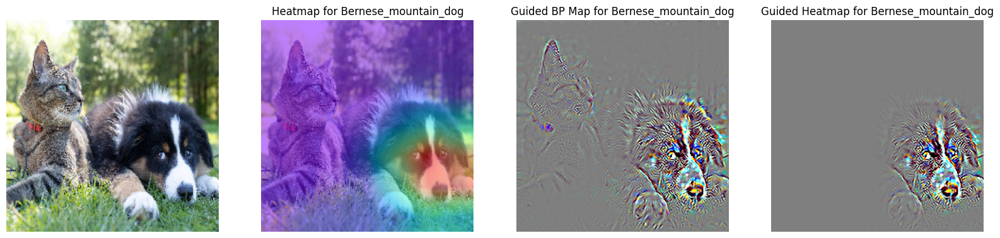

In [11]:
TOP_K_INDEX = 1
heatmap = grad_cam(
    model,
    last_conv_layer,
    decode_predictions,
    image_arr,
    TOP_K_INDEX,
    counterfactual=False,
)
# heatmap = grad_cam_plusplus(model, last_conv_layer, decode_predictions, image_arr, TOP_K_INDEX, counterfactual=False)
guided_bp_map = guided_backpropagation(
    model, image_arr, top_k_index=TOP_K_INDEX
).numpy()
draw_guided_heatmap(image, guided_bp_map, [heatmap[TOP_K_INDEX - 1]])

## 8. Conv Layer Comparison for ResNet50

Here you can compare the activations of each ResNet50 convolutional ResNet block for a chosen image.

Computing Heatmaps for grad_cam:   0%|          | 0/16 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

Computing Grad-CAM Heatmaps:   0%|          | 0/1 [00:00<?, ?it/s]

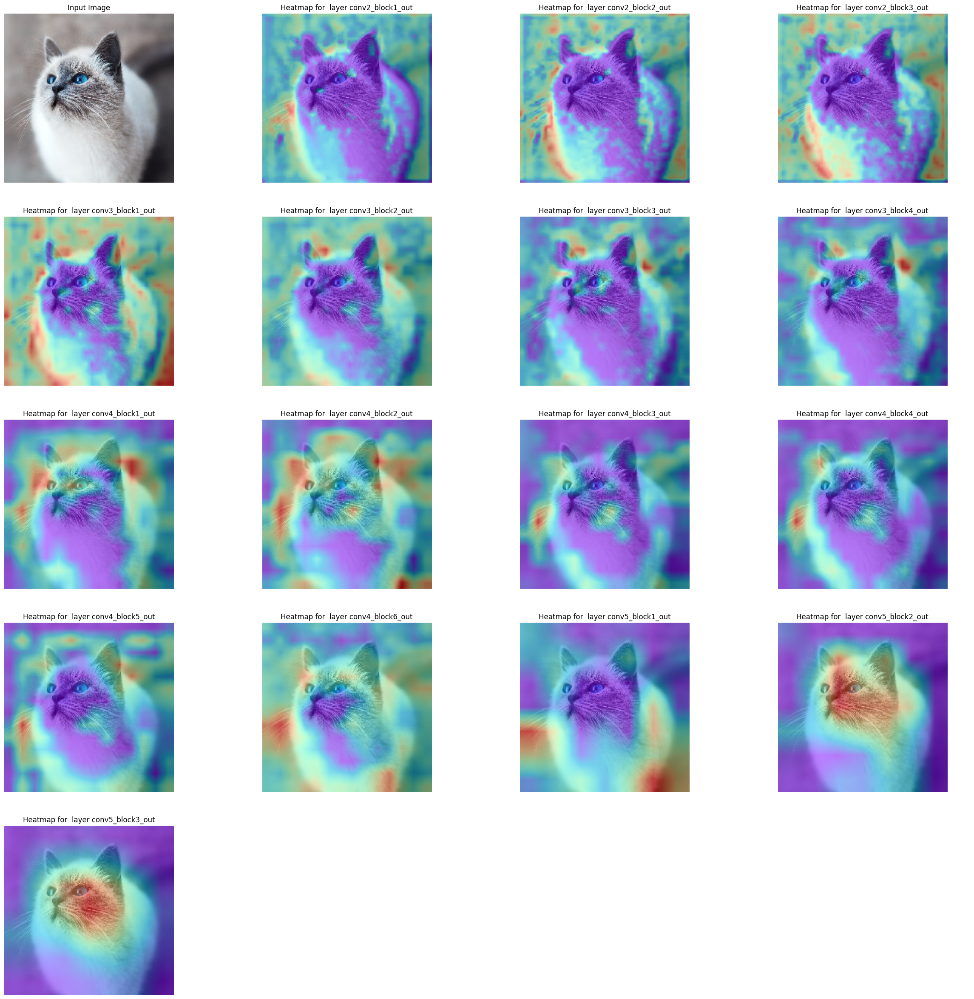

In [12]:
conv_layer_comparision("images/cat.jpg", method="grad_cam")
# conv_layer_comparision("images/cat.jpg", method="grad_cam_plusplus")

## 9. References

[1] Zhou, Bolei, et al. "Learning deep features for discriminative localization." *Proceedings of the IEEE conference on computer vision and pattern recognition.* 2016. https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf

[2] Selvaraju, Ramprasaath R., et al. "Grad-cam: Visual explanations from deep networks via gradient-based localization." *Proceedings of the IEEE international conference on computer vision.* 2017. https://arxiv.org/pdf/1610.02391.pdf

[3]  Chattopadhyay, Aditya, et al. "Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks." *Proceedings of the IEEE Winter Conf. on Applications of Computer Vision.* 2019. https://arxiv.org/pdf/1710.11063.pdf

[4] All other images are from: https://unsplash.com/